<a href="https://colab.research.google.com/github/shikhaup/Meter-Reading-Detection-using-YoloV3-/blob/main/YoloV3_MeterReading.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Connecting Colab with Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd drive/My\ Drive/TensorFlow-2.x-YOLOv3
!ls

/content/drive/My Drive/TensorFlow-2.x-YOLOv3
checkpoints	     LICENSE		README.md
custom_dataset	     log		requirements.txt
deep_sort	     mAP		tools
detection_custom.py  meter_reading.h5	train.py
detection_demo.py    mnist		yolov3
detect_mnist.py      model_data		YOLOv3_colab_training.ipynb
evaluate_mAP.py      object_tracker.py
IMAGES		     __pycache__


Downloading Requirements

In [ ]:
!pip install -r ./requirements.txt

     |████████████████████████████████| 320.4MB 48kB/s 
     |████████████████████████████████| 61kB 8.7MB/s 
     |████████████████████████████████| 3.3MB 50.8MB/s 
     |████████████████████████████████| 6.6MB 48.8MB/s 
  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=2856aee3e2ad2931262f9466eb75544591c5eb3c3e3cf36c8c693e342844e7b4
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget
ERROR: boto3 1.14.63 has requirement botocore<1.18.0,>=1.17.63, but you'll have botocore 1.18.5 which is incompatible.
  Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1
  Found existing installation: rsa 4.6
    Uninstalling rsa-4.6:
      Successfully uninstalled rsa-4.6
  Found existing installation: botocore 1.17.63
    Uninstalling botocore-1.17.63:
      Successfully uninstalled botocore-1.17.63


Checking Tensorflow Version and GPU 

In [ ]:
import tensorflow as tf
print(tf.__version__)
tf.test.gpu_device_name()

2.3.0


'/device:GPU:0'

**Converting the meter dataset into Yolo format**

*   The XML_to_YOLOv3.py parses the XML files which contains the annotations of the images namely,***xmin, ymin, xmax, ymax***. This code requires the .xml files and images to be in the same folder.  
*   Using **xml.etree.ElementTree** API the tags are found and stored as objects and at the end for each file written into a text file.
*   Each XML file parsed is stored in one line of the Text file. Also the path to the image is stored foolowed by the bounding box labels and the class.
*   At the end it will create three text file namely, ***meter_name.txt*** which contains class labels (here one- Artmeter), ***meter_train.txt*** containing train dataset and ***meter_test.txt*** .








In [ ]:
!python tools/XML_to_YOLOv3.py

/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/02800000312015_0.jpg 83,359,467,417,0
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/00880000021280_0.jpg 40,156,404,214,0
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/00883201357476_0.jpg 89,106,372,147,0
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/00882400585119_0.jpg 74,170,403,236,0
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/02800000311884_0.jpg 49,303,596,390,0
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/02800000310218_0.jpg 194,252,558,397,0
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/02800000311992_0.jpg 231,280,596,382,0
/content/drive/My Drive/TensorFlow-2.x-YOLOv3/custom_dataset/train/Annotations/02800000312555_0.jpg 

**Training the model**
*  The train.py file is where the model is created and all the losses are calculates. 
*  It loads all the files like ***configs.py, dataset.py, utils.py, yolov3.py, and evaluate_mAP.py*** .
* Trained for 100 Epochs with a Batch size of 4. 

In [ ]:
!python train.py

2020-09-25 12:47:38.195479: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-25 12:47:39.510465: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN)to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2020-09-25 12:47:39.515439: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2200000000 Hz
2020-09-25 12:47:39.515622: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x1caebc0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-09-25 12:47:39.515651: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2020-09-25 12:47:39.517604: I tensorflow/stream_executor/platform/default/dso_lo

In [ ]:
yolo.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
conv2d_75 (Conv2D)              (None, 416, 416, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_72 (BatchNo (None, 416, 416, 32) 128         conv2d_75[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_72 (LeakyReLU)      (None, 416, 416, 32) 0           batch_normalization_72[0][0]     
_______________________________________________________________________________________

In [ ]:
yolo.get_config()

{'input_layers': [['input_3', 0, 0]],
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 640, 640, 3),
    'dtype': 'float32',
    'name': 'input_3',
    'ragged': False,
    'sparse': False},
   'inbound_nodes': [],
   'name': 'input_3'},
  {'class_name': 'Conv2D',
   'config': {'activation': 'linear',
    'activity_regularizer': None,
    'bias_constraint': None,
    'bias_initializer': {'class_name': 'Constant', 'config': {'value': 0.0}},
    'bias_regularizer': None,
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'dtype': 'float32',
    'filters': 32,
    'groups': 1,
    'kernel_constraint': None,
    'kernel_initializer': {'class_name': 'RandomNormal',
     'config': {'mean': 0.0, 'seed': None, 'stddev': 0.01}},
    'kernel_regularizer': {'class_name': 'L2',
     'config': {'l2': 0.0005000000237487257}},
    'kernel_size': (3, 3),
    'name': 'conv2d_150',
    'padding': 'same',
    'strides': (1, 1),
    'trainable': True,
  

**Loading weights**
* Here we are the weights that are learned from the checkpointing method.
 

In [ ]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  
import tensorflow as tf
from yolov3.yolov4 import Create_Yolo
from yolov3.utils import load_yolo_weights, detect_image
from yolov3.configs import *

if YOLO_TYPE == "yolov4":
    Darknet_weights = YOLO_V4_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V4_WEIGHTS
if YOLO_TYPE == "yolov3":
    Darknet_weights = YOLO_V3_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V3_WEIGHTS
yolo = Create_Yolo(input_size=TRAIN_INPUT_SIZE, CLASSES=TRAIN_CLASSES)
yolo.load_weights("/content/drive/My Drive/TensorFlow-2.x-YOLOv3/model_data/Copy of yolov3_custom") # use keras weights

**Testing the model on different images**

GPUs [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


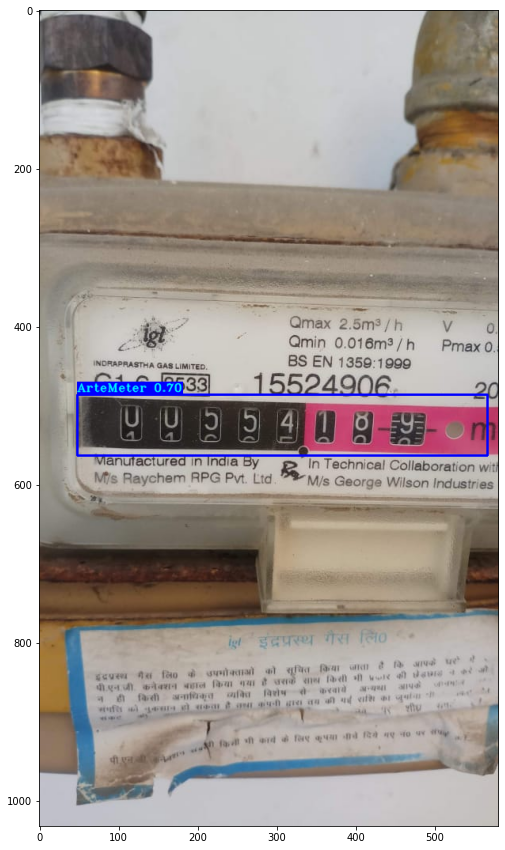

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import cv2
import numpy as np
import tensorflow as tf
from yolov3.utils import detect_image, detect_realtime, detect_video, Load_Yolo_model, detect_video_realtime_mp
from yolov3.configs import *

image_path   = "/content/drive/My Drive/yolov3_tf2.x/IMAGES/test1.jpeg"
#video_path   = "./IMAGES/test.mp4"

yolo = Load_Yolo_model()
#detect_image(yolo, image_path, "/content/drive/My Drive/yolov3_tf2.x/IMAGES/output.jpeg", input_size=YOLO_INPUT_SIZE, show=True, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
#detect_video(yolo, video_path, './IMAGES/detected.mp4', input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
#detect_realtime(yolo, '', input_size=YOLO_INPUT_SIZE, show=True, CLASSES=TRAIN_CLASSES, rectangle_colors=(255, 0, 0))
image = detect_image(yolo, image_path, '', input_size=YOLO_INPUT_SIZE, show=False, rectangle_colors=(255,0,0))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,15))
plt.imshow(image)
#detect_video_realtime_mp(video_path, "Output.mp4", input_size=YOLO_INPUT_SIZE, show=True, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0), realtime=False)


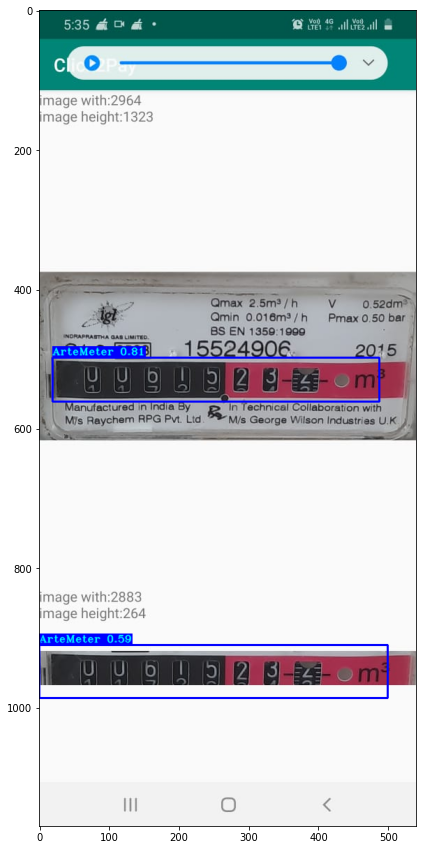

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import cv2
import numpy as np
import tensorflow as tf
from yolov3.utils import detect_image, detect_realtime, detect_video, Load_Yolo_model, detect_video_realtime_mp
from yolov3.configs import *

image_path   = "/content/drive/My Drive/yolov3_tf2.x/IMAGES/test2.jpeg"
#video_path   = "./IMAGES/test.mp4"

image = detect_image(yolo, image_path, '', input_size=YOLO_INPUT_SIZE, show=False, rectangle_colors=(255,0,0))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,15))
plt.imshow(image)

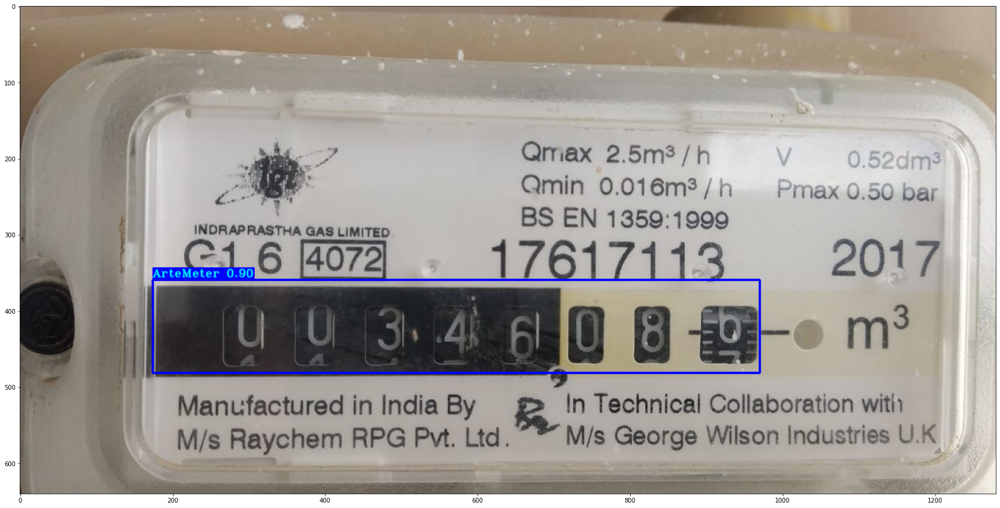

In [ ]:
image_path   = "/content/drive/My Drive/yolov3_tf2.x/IMAGES/test4.jpeg"
#video_path   = "./IMAGES/test.mp4"

image = detect_image(yolo, image_path, '', input_size=YOLO_INPUT_SIZE, show=False, rectangle_colors=(255,0,0))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,15))
plt.imshow(image)

**Saving the model**

In [ ]:
from keras.models import load_model

yolo.save('/content/drive/My Drive/TensorFlow-2.x-YOLOv3/meter_reading.h5')

**Viewing the Losses in Tensorboard**

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir "/content/drive/My Drive/TensorFlow-2.x-YOLOv3/log/"

<IPython.core.display.Javascript object>